# Dataset PreProcessing

In [1]:
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

ModuleNotFoundError: No module named 'pandas'

In [ ]:
# Step 1: Load the CSV data
df = pd.read_csv("city_day.csv")


In [ ]:
# Step 2: Filter data for Hyderabad
df_hyderabad = df[df['City'] == 'Hyderabad']

In [ ]:
# Step 3: Remove rows with NaN values
df_hyderabad_cleaned = df_hyderabad.dropna()

In [ ]:
# After reading the CSV and filtering for Hyderabad, do:
df_hyderabad_cleaned['Date'] = pd.to_datetime(df_hyderabad_cleaned['Date'], format='%Y-%m-%d')

# Sort by date
df_hyderabad_cleaned.sort_values('Date', inplace=True)
df_hyderabad_cleaned.reset_index(drop=True, inplace=True)

In [ ]:
# Step 4: Display distribution of AQI_Bucket before SMOTE
print("Distribution of AQI_Bucket before SMOTE:")
print(df_hyderabad_cleaned['AQI_Bucket'].value_counts())

Distribution of AQI_Bucket before SMOTE:
AQI_Bucket
Moderate        810
Satisfactory    645
Good            126
Poor             30
Severe            4
Very Poor         3
Name: count, dtype: int64


In [ ]:
# Step 5: Separate features and target (AQI_Bucket)
X = df_hyderabad_cleaned.drop(columns=['AQI_Bucket', 'City', 'Date'])  
y = df_hyderabad_cleaned['AQI_Bucket']

In [ ]:
# Step 6: Apply SMOTE to balance the AQI_Bucket classes (with reduced n_neighbors)
smote = SMOTE(random_state=42, k_neighbors=2)  # Reduced n_neighbors to 2
X_resampled, y_resampled = smote.fit_resample(X, y)

In [ ]:
# Step 7: Display distribution of AQI_Bucket after SMOTE
print("Distribution of AQI_Bucket after SMOTE:")
print(y_resampled.value_counts())

Distribution of AQI_Bucket after SMOTE:
AQI_Bucket
Moderate        810
Satisfactory    810
Very Poor       810
Poor            810
Severe          810
Good            810
Name: count, dtype: int64


In [ ]:
# Step 8: Recombine the features and target into a DataFrame
df_resampled = pd.DataFrame(X_resampled, columns=X.columns)
df_resampled['AQI_Bucket'] = y_resampled

In [ ]:
# Step 9: Save the cleaned and resampled data to a new CSV
df_resampled.to_csv('hyderabad_aqi_resampled.csv', index=False)

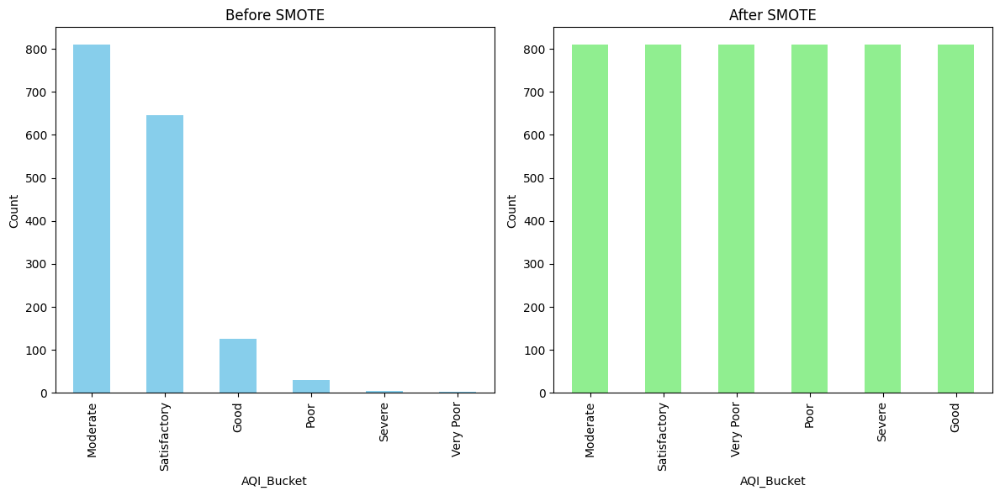

In [ ]:
# Step 10: Plot the distribution of AQI_Bucket before and after SMOTE
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Before SMOTE
df_hyderabad_cleaned['AQI_Bucket'].value_counts().plot(kind='bar', ax=axes[0], color='skyblue', title='Before SMOTE')
axes[0].set_xlabel('AQI_Bucket')
axes[0].set_ylabel('Count')

# After SMOTE
y_resampled.value_counts().plot(kind='bar', ax=axes[1], color='lightgreen', title='After SMOTE')
axes[1].set_xlabel('AQI_Bucket')
axes[1].set_ylabel('Count')

plt.tight_layout()
plt.show()

# Dataset EDA

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import zscore
import missingno as msno

# Load the dataset
df = pd.read_csv('hyderabad_aqi_resampled.csv')

# Display first few rows
df.head()

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
0,91.82,32.94,5.41,28.93,23.37,24.94,0.48,7.98,27.04,1.01,5.74,0.68,179.0,Moderate
1,35.56,40.81,4.02,31.15,24.31,24.81,0.57,4.93,22.48,1.41,7.61,0.89,162.0,Moderate
2,45.64,44.89,7.06,28.96,25.58,24.80,0.73,5.29,24.69,1.25,7.84,0.85,76.0,Satisfactory
3,60.88,51.27,5.15,30.64,24.22,25.86,0.53,5.16,24.11,1.09,5.42,0.48,140.0,Moderate
4,65.61,41.31,3.40,26.03,20.37,24.78,0.57,5.44,25.47,0.83,4.39,0.22,128.0,Moderate


In [ ]:
# Check the dataset shape and info
print(df.shape)  # Rows and columns

(4860, 14)


In [ ]:
print(df.info())  # Data types, missing values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4860 entries, 0 to 4859
Data columns (total 14 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   PM2.5       4860 non-null   float64
 1   PM10        4860 non-null   float64
 2   NO          4860 non-null   float64
 3   NO2         4860 non-null   float64
 4   NOx         4860 non-null   float64
 5   NH3         4860 non-null   float64
 6   CO          4860 non-null   float64
 7   SO2         4860 non-null   float64
 8   O3          4860 non-null   float64
 9   Benzene     4860 non-null   float64
 10  Toluene     4860 non-null   float64
 11  Xylene      4860 non-null   float64
 12  AQI         4860 non-null   float64
 13  AQI_Bucket  4860 non-null   object 
dtypes: float64(13), object(1)
memory usage: 531.7+ KB
None


In [ ]:
print(df.describe())  # Statistical summary

             PM2.5         PM10           NO          NO2          NOx  \
count  4860.000000  4860.000000  4860.000000  4860.000000  4860.000000   
mean    133.151967    88.076475     7.018990    20.409781    16.762575   
std     145.621229    35.609542     4.116500    14.545312     9.039448   
min       5.560000    10.540000     1.220000     0.620000     1.580000   
25%      28.867793    66.545000     3.830000    11.320994     9.971060   
50%      73.356677    94.033116     6.260000    17.138867    15.804680   
75%     166.270508   105.677830     9.040754    25.560000    22.071789   
max     525.090000   485.880000    38.060000    92.330000    63.290000   

               NH3           CO          SO2           O3      Benzene  \
count  4860.000000  4860.000000  4860.000000  4860.000000  4860.000000   
mean     13.868034     0.749990     8.532421    32.902758     1.196388   
std       6.672830     0.407603     6.337896    12.557017     0.926110   
min       2.500000     0.000000     1

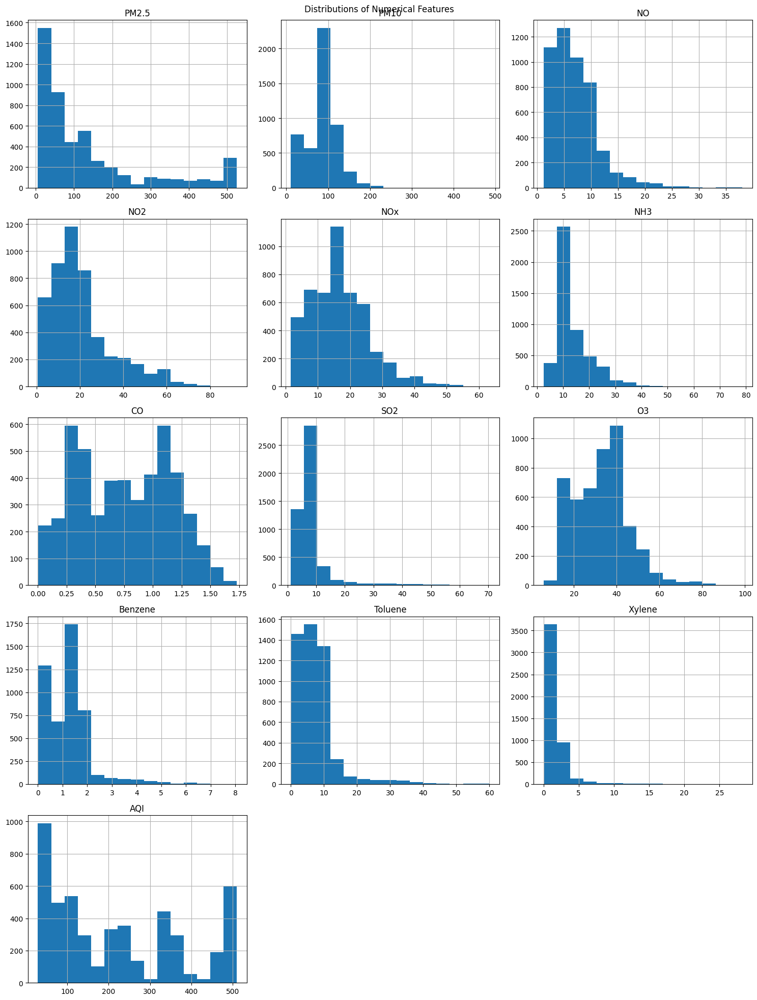

In [ ]:
# Plot histograms of all numerical columns
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Calculate layout based on the number of numerical columns
n_cols = 3  # Fixed number of columns (you can change this)
n_rows = (len(numerical_cols) // n_cols) + (len(numerical_cols) % n_cols > 0)

# Create the histograms
df[numerical_cols].hist(bins=15, figsize=(15, n_rows*4), layout=(n_rows, n_cols))

# Set the title
plt.suptitle('Distributions of Numerical Features')
plt.tight_layout()
plt.show()

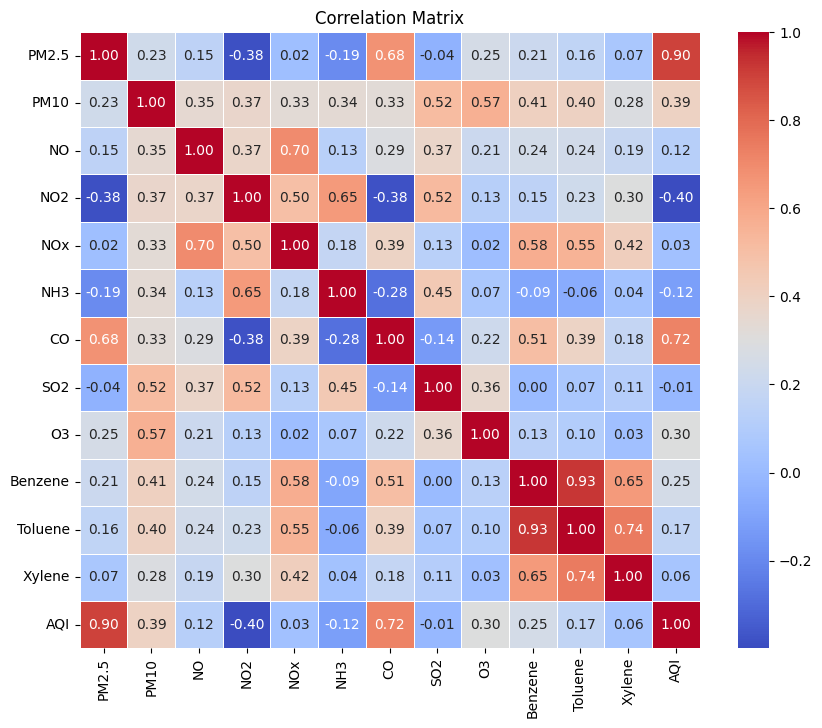

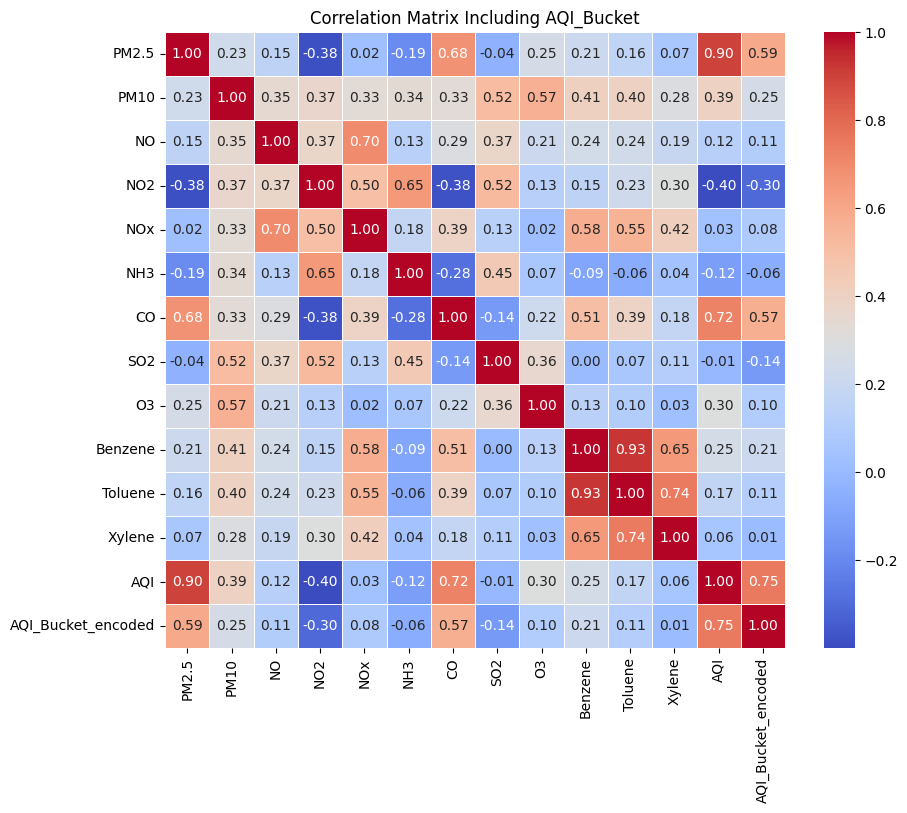

Correlation of AQI with other features:
AQI                   1.000000
PM2.5                 0.898169
AQI_Bucket_encoded    0.751846
CO                    0.724914
PM10                  0.393554
O3                    0.300197
Benzene               0.247994
Toluene               0.167921
NO                    0.124366
Xylene                0.058197
NOx                   0.033913
SO2                  -0.007408
NH3                  -0.118342
NO2                  -0.399267
Name: AQI, dtype: float64


In [ ]:
# Exclude the non-numeric columns before calculating correlation
numerical_cols = df.select_dtypes(include=[float, int]).columns.tolist()

# Calculate the correlation matrix on numeric columns
corr_matrix = df[numerical_cols].corr()

# Plot the correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

# Focus on AQI and AQI_Bucket if you want to include AQI_Bucket as well
# Encoding AQI_Bucket as a numeric column
df['AQI_Bucket_encoded'] = df['AQI_Bucket'].astype('category').cat.codes

# Calculate the correlation matrix including AQI_Bucket_encoded
corr_matrix_with_aqi_bucket = df[numerical_cols + ['AQI_Bucket_encoded']].corr()

# Plot the updated correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix_with_aqi_bucket, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix Including AQI_Bucket')
plt.show()

# Focus on AQI and AQI_Bucket
aqi_corr = corr_matrix_with_aqi_bucket['AQI'].sort_values(ascending=False)
print(f'Correlation of AQI with other features:\n{aqi_corr}')

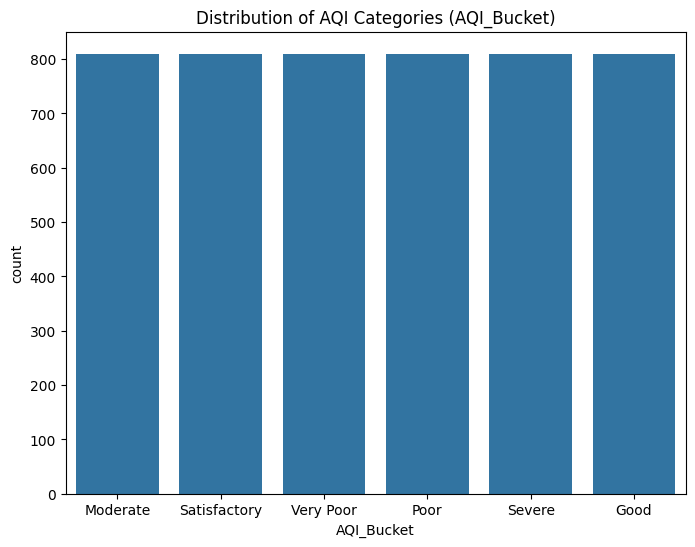

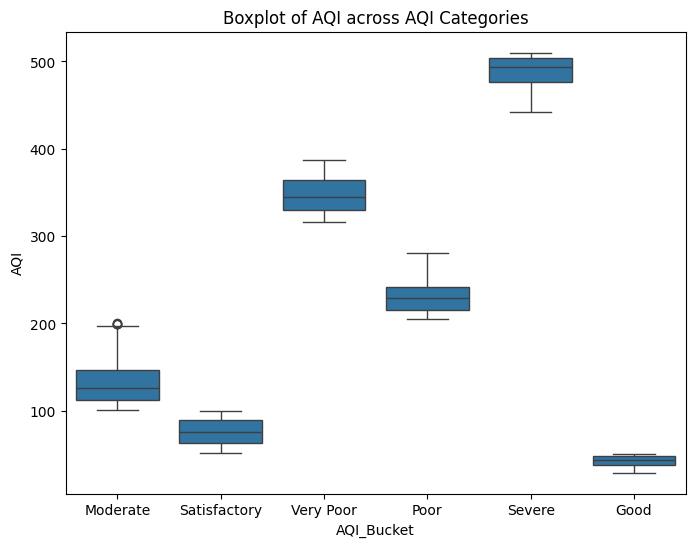

In [ ]:
# Countplot for AQI_Bucket
plt.figure(figsize=(8, 6))
sns.countplot(x='AQI_Bucket', data=df)
plt.title('Distribution of AQI Categories (AQI_Bucket)')
plt.show()

# AQI distribution across AQI_Bucket categories
plt.figure(figsize=(8, 6))
sns.boxplot(x='AQI_Bucket', y='AQI', data=df)
plt.title('Boxplot of AQI across AQI Categories')
plt.show()

In [ ]:
# Calculate Z-scores
z_scores = np.abs(zscore(df[numerical_cols]))

# Set threshold for outlier detection (Z-score > 3 is generally considered an outlier)
outliers = (z_scores > 3)

# Get rows with outliers
outlier_rows = df[np.any(outliers, axis=1)]
print(f'Outlier Rows:\n{outlier_rows}')

Outlier Rows:
           PM2.5        PM10         NO        NO2        NOx        NH3  \
94     74.080000   94.000000   4.720000   8.910000  12.190000  10.420000   
95     79.900000   99.880000   4.840000  12.230000  15.520000  10.350000   
98     68.430000   98.430000  24.600000  27.590000  50.510000  10.350000   
99     83.760000  102.690000  38.060000  29.600000  52.780000  10.510000   
100   177.620000   98.010000  28.460000  25.500000  52.220000  10.460000   
...          ...         ...        ...        ...        ...        ...   
3103   47.389370   86.387633   3.095747  31.234470  16.578756  47.996489   
3115   40.408108   97.193344   4.329713  30.645059  19.554163  13.495236   
3144   48.515200  101.405819  13.943976  38.125916  30.429590  16.838471   
3147   55.673328   94.884716  11.909434  64.801749  13.293205  37.210622   
3193   25.235115   83.179699  16.481690  78.436788  16.994761  28.275027   

            CO        SO2         O3   Benzene    Toluene     Xylene  \
9

In [ ]:
# Check for skewness in the data
skewness = df[numerical_cols].skew()
print(f"Skewness:\n{skewness}")

# Apply log transformation to heavily skewed features (optional)
df['log_PM2.5'] = np.log1p(df['PM2.5'])
df['log_PM10'] = np.log1p(df['PM10'])

# Check again for skewness
print(f"Skewness after log transformation:\n{df[['log_PM2.5', 'log_PM10']].skew()}")

Skewness:
PM2.5      1.505784
PM10       0.403647
NO         1.615278
NO2        1.226728
NOx        0.809155
NH3        1.920992
CO         0.017882
SO2        4.126774
O3         0.622860
Benzene    1.875349
Toluene    2.785170
Xylene     5.246544
AQI        0.527973
dtype: float64
Skewness after log transformation:
log_PM2.5   -0.004160
log_PM10    -1.189421
dtype: float64


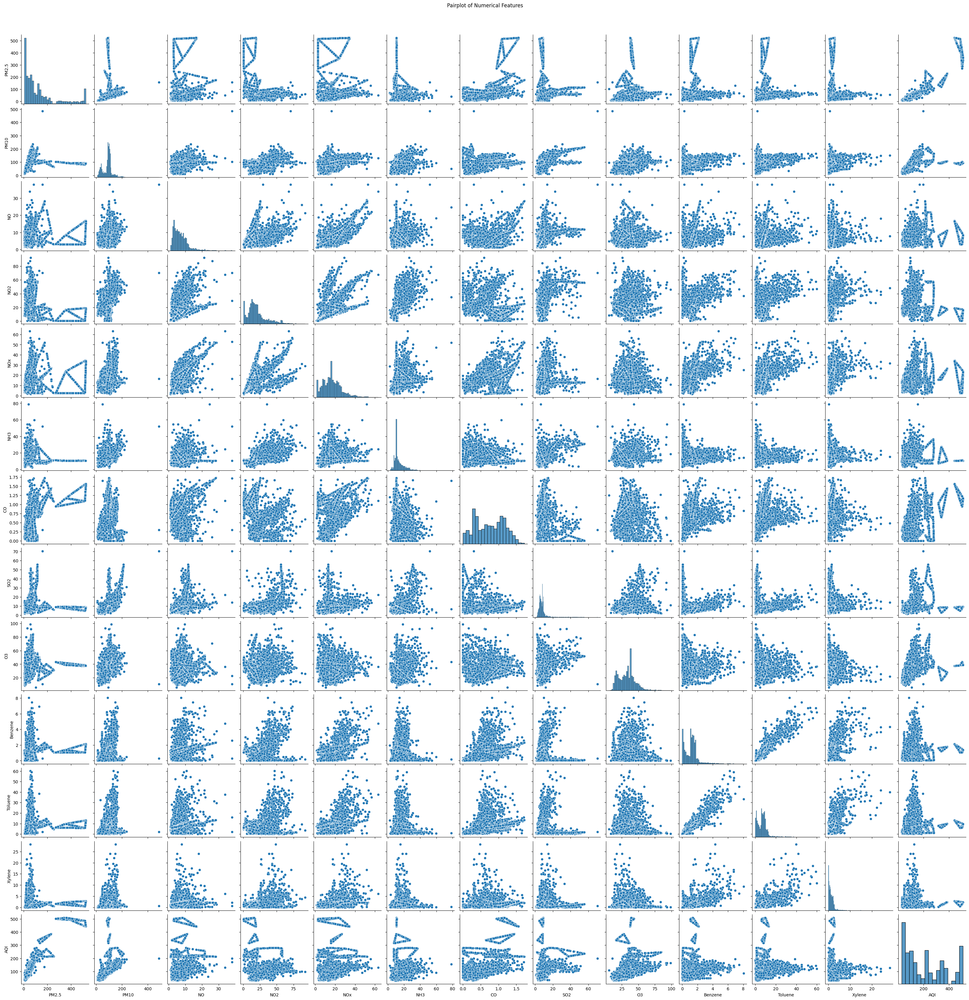

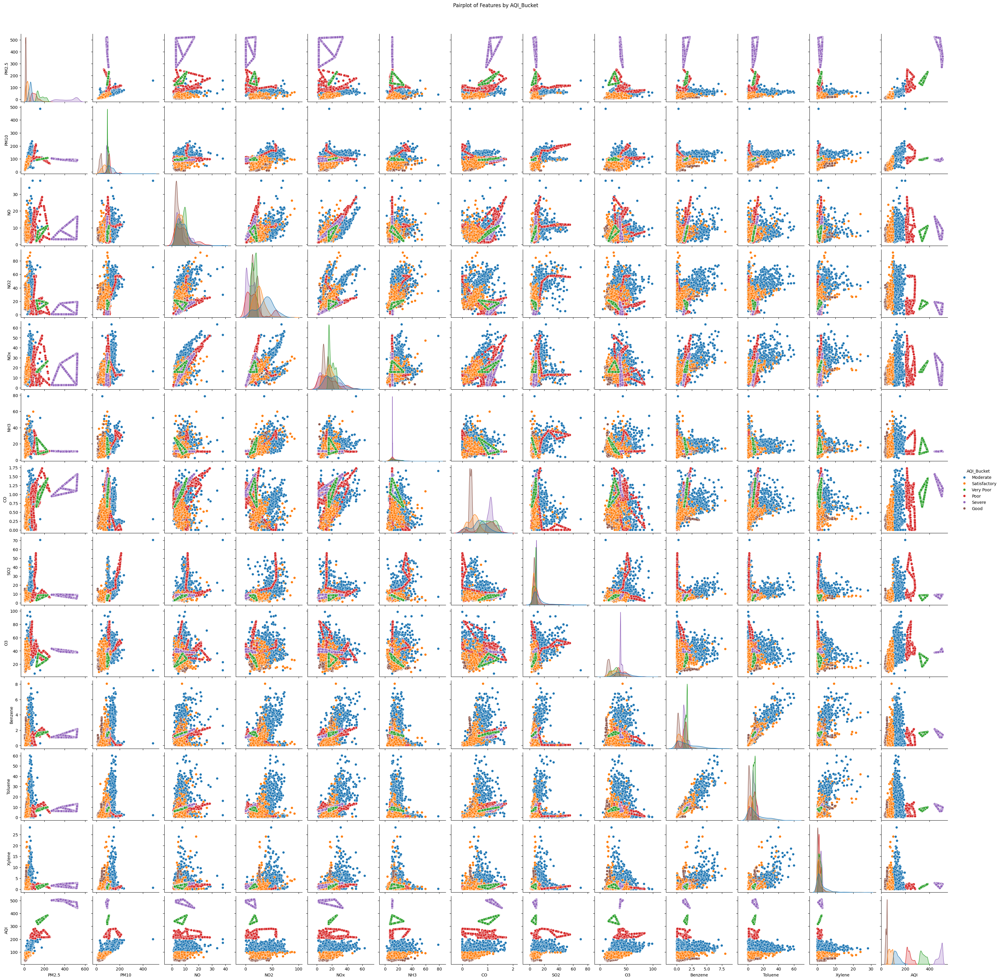

In [ ]:
# Pairplot for the numerical features
sns.pairplot(df[numerical_cols])
plt.suptitle('Pairplot of Numerical Features', y=1.02)
plt.show()

# Pairplot for features with respect to AQI_Bucket
sns.pairplot(df, hue='AQI_Bucket', vars=numerical_cols)
plt.suptitle('Pairplot of Features by AQI_Bucket', y=1.02)
plt.show()

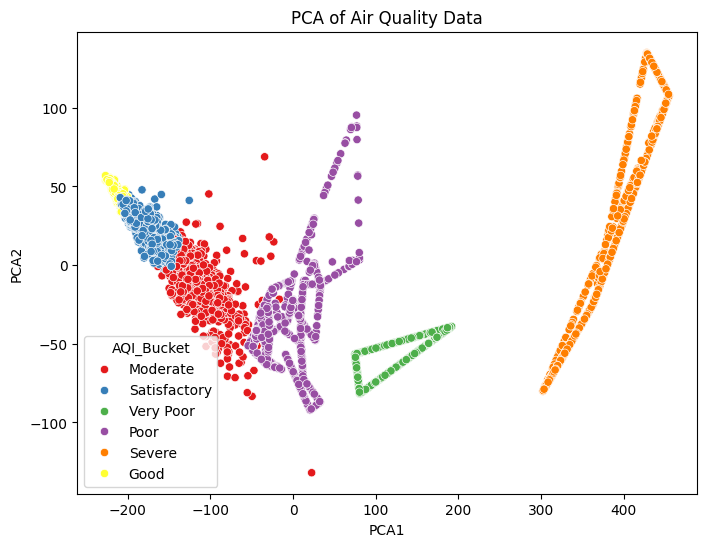

In [ ]:
from sklearn.decomposition import PCA

# PCA for dimensionality reduction
pca = PCA(n_components=2)
pca_result = pca.fit_transform(df[numerical_cols])

# Create a DataFrame for the PCA result
pca_df = pd.DataFrame(data=pca_result, columns=['PCA1', 'PCA2'])

# Plotting the PCA results
plt.figure(figsize=(8, 6))
sns.scatterplot(x='PCA1', y='PCA2', hue=df['AQI_Bucket'], data=pca_df, palette='Set1')
plt.title('PCA of Air Quality Data')
plt.show()

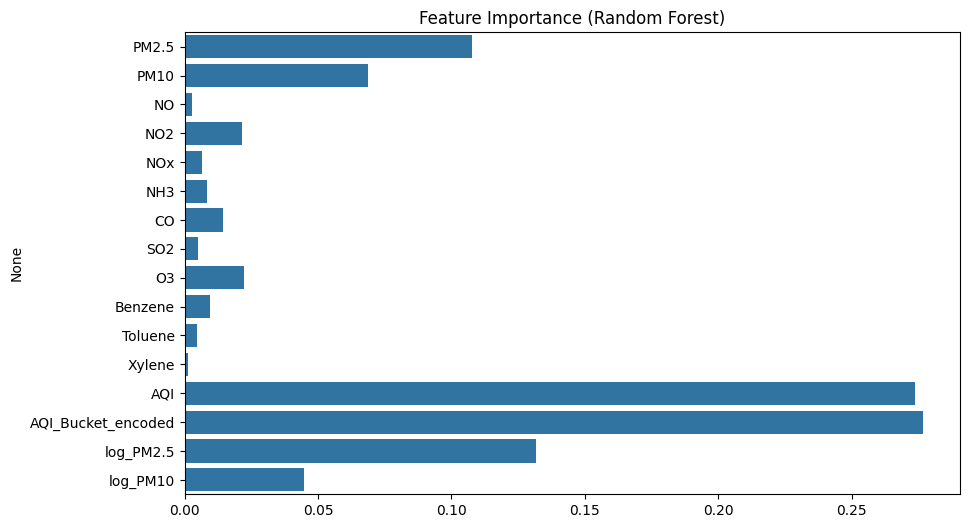

In [ ]:
from sklearn.ensemble import RandomForestClassifier

# Train a Random Forest model
X = df.drop(columns=['AQI_Bucket'])
y = df['AQI_Bucket']
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X, y)

# Plot feature importance
importance = rf_model.feature_importances_
feature_names = X.columns
plt.figure(figsize=(10, 6))
sns.barplot(x=importance, y=feature_names)
plt.title('Feature Importance (Random Forest)')
plt.show()

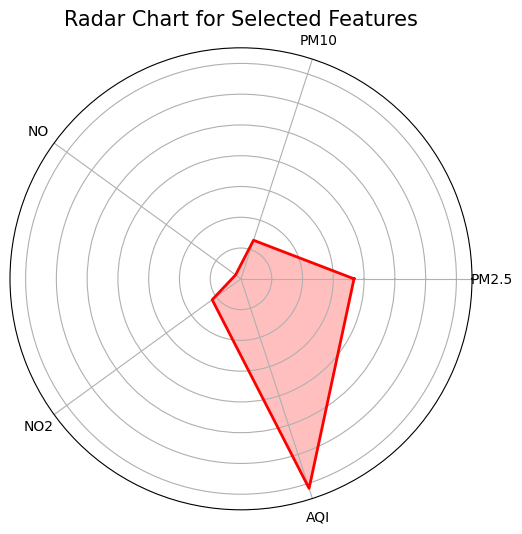

In [ ]:
# Example Radar Chart for AQI features
import math

# Example: Radar plot for a few selected features (PM2.5, PM10, NO, NO2, and AQI)
labels = ['PM2.5', 'PM10', 'NO', 'NO2', 'AQI']
values = [91.82, 32.94, 5.41, 28.93, 179.0]

# Number of variables
num_vars = len(labels)

# Compute angle for each axis
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

# Make the plot circular
values += values[:1]
angles += angles[:1]

# Plot
fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))
ax.fill(angles, values, color='red', alpha=0.25)
ax.plot(angles, values, color='red', linewidth=2)

# Labeling
ax.set_yticklabels([])
ax.set_xticks(angles[:-1])
ax.set_xticklabels(labels)
ax.set_title('Radar Chart for Selected Features', size=15)
plt.show()

# Model training and prediction

In [ ]:
import pandas as pd
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

In [ ]:
# Load the dataset
file_path = 'hyderabad_aqi_resampled.csv'
data = pd.read_csv(file_path)

In [ ]:
# Select only the required features for X and set the target variable y as AQI
features = ['PM2.5', 'CO', 'NO2', 'SO2', 'PM10']
X = data[features]
y = data['AQI']

In [ ]:
# Select only the required features for X and set the target variable y as AQI
features = ['PM2.5', 'CO', 'NO2', 'SO2', 'PM10']
X = data[features]
y = data['AQI']

In [ ]:
# Split the data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# Initialize and train a Random Forest Regressor model
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [ ]:
import numpy as np

# Make predictions on the test set and evaluate model performance
y_pred = model.predict(X_test)
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)  # Calculate RMSE
mae = mean_absolute_error(y_test, y_pred)

accuracy = 100 * (1 - (mae / np.mean(y_test)))

# Print all metrics
print(f"R-squared: {r2}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Accuracy: {accuracy:.2f}%")

R-squared: 0.9942052222513066
Mean Squared Error (MSE): 141.05921405048483
Root Mean Squared Error (RMSE): 11.87683518663473
Mean Absolute Error (MAE): 4.7485187520646175
Accuracy: 97.85%


In [ ]:
import plotly.graph_objects as go

fig = go.Figure()

# Plot Actual AQI as a line
fig.add_trace(go.Scatter(
    x=y_test.index,
    y=y_test,
    mode='lines',
    name='Actual AQI',
    line=dict(color='blue', width=2)
))

# Plot Predicted AQI as a line
fig.add_trace(go.Scatter(
    x=y_test.index,
    y=y_pred,
    mode='lines',
    name='Predicted AQI',
    line=dict(color='red', width=2)
))

fig.update_layout(
    title="Actual vs. Predicted AQI (Line Chart)",
    xaxis_title="Index",
    yaxis_title="AQI",
    template="plotly_dark",
    showlegend=True
)

fig.show()

In [ ]:
# Example: Forecasting AQI with new data using only the selected features
new_data = pd.DataFrame({
    'PM2.5': [45.5],
    'CO': [0.6],
    'NO2': [30.4],
    'SO2': [10.3],
    'PM10': [50.3]
})

predicted_aqi = model.predict(new_data)
print(f"Predicted AQI for new data: {predicted_aqi[0]}")

Predicted AQI for new data: 88.27814584098212


In [ ]:
import numpy as np
import plotly.graph_objs as go

# Split based on date
cutoff_date = '2018-01-01'
train_data = df_hyderabad_cleaned[df_hyderabad_cleaned['Date'] < cutoff_date]
test_data  = df_hyderabad_cleaned[df_hyderabad_cleaned['Date'] >= cutoff_date]

# Separate features and target
X_train = train_data[features]
y_train = train_data['AQI']
X_test  = test_data[features]
y_test  = test_data['AQI']

# Make predictions
y_pred = model.predict(X_test)

# Optional: Clip predictions for more realistic AQI values (e.g., 0–500 range)
y_pred_clipped = np.clip(y_pred, 0, 500)

# Plot actual vs predicted AQI
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=test_data['Date'],
    y=y_test,
    mode='lines',
    name='Actual AQI',
    line=dict(color='blue', width=2)
))

fig.add_trace(go.Scatter(
    x=test_data['Date'],
    y=y_pred_clipped,
    mode='lines',
    name='Predicted AQI',
    line=dict(color='red', width=2)
))

fig.update_layout(
    title="Actual vs. Predicted AQI (Time Series)",
    xaxis_title="Date",
    yaxis_title="AQI",
    template="plotly_dark",
    showlegend=True,
    yaxis=dict(range=[0, 500]),  # Limit y-axis for readability
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=3, label="3m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(visible=True),
        type="date"
    )
)

fig.show()